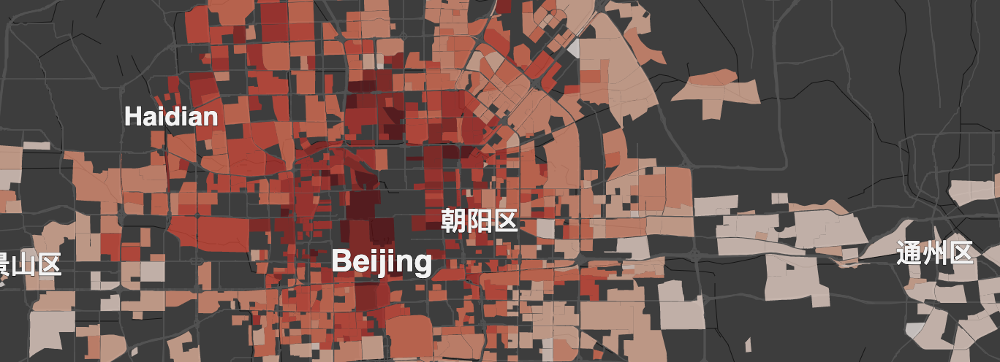

**Spatial joining** is similar to joining data by attributes, but instead of using key attributes, it uses locations to join tables.

For example, a table containing points can be spatially joined with a table containing areas (Polygons) basing on "within" relationship.

In this notebook we will spatially join the Beijing listings dataset and Beijing city-blocks (polygons). 

Then we will create a choropleth map showing an average property price (per square) by city-blocks.


### Libraries

- Geopandas: geo-dataframe and spatial operations.
- Rtree: used by Geopandas for spatial indexing.
- [Lets-Plot](https://lets-plot.org/): all plotting, including interactive maps.

In [1]:
# !pip install Rtree -U

In [2]:
# !pip install Lets-Plot -U
# !pip install lets-plot==4.5.0

In [3]:
import pandas as pd
import geopandas as gpd
from lets_plot import *

LetsPlot.setup_html()
LetsPlot.set(maptiles_lets_plot(theme="dark"))

In [4]:
import lets_plot
lets_plot.__version__

'4.5.1'

### Beijing city-blocks

The Beijing city-blocks geojson file can be downloaded from this [GitHub repository](https://github.com/alshan/china-city-blocks).

In [5]:
city_blocks = gpd.read_file("https://github.com/alshan/china-city-blocks/raw/main/output/beijing_city_blocks_2016.geojson")

# Add some kind of ID to city-blocks.
city_blocks["block_id"] = [i for i in range(0, city_blocks.shape[0])]
city_blocks.head(3)

,Aream2,geometry,block_id
0,36974.173640,"POLYGON ((116.32025 39.66752, 116.32029 39.667...",0
1,149751.771945,"POLYGON ((116.31862 39.67311, 116.31842 39.672...",1
2,313022.865065,"POLYGON ((116.31381 39.67698, 116.31382 39.676...",2


#### Quick peek at city-blocks of Beijing.

In [6]:
(ggplot() +
    geom_map(map=city_blocks, size=0.1) +
    theme_void() +
    ggsize(600, 600))

### Beijing listings: brief EDA and data preparation

In [7]:
#listings = pd.read_csv('/kaggle/input/lianjia/new.csv', encoding='latin_1')
listings = pd.read_csv('Data/new.csv', encoding='latin_1')
listings.shape

/tmp/ipykernel_5601/2724483669.py:2: DtypeWarning: Columns (1,11,12,14) have mixed types. Specify dtype option on import or set low_memory=False.
  listings = pd.read_csv('Data/new.csv', encoding='latin_1')


(318851, 26)

In [8]:
# Select the columns we need and check for missing values.
listings = listings[['Lng', 'Lat', 'tradeTime', 'price', "district"]]
listings.isnull().sum()

Lng          0
Lat          0
tradeTime    0
price        0
district     0
dtype: int64

In [9]:
# Replace 'tradeTime' with just 'year' (Integer).
listings['year'] = pd.DatetimeIndex(listings['tradeTime']).year
listings.drop(['tradeTime'], axis=1, inplace=True)

In [10]:
# The price dynamics over the years.

# According to the dataset description, the 'price' column contains avg. price per square.
(ggplot(listings) + 
 geom_point(aes(x='year', y='price'), position='jitter', alpha=0.5, sampling=sampling_random(n=3000)) + 
 geom_smooth(aes(x='year', y='price'), method='lm', deg=2, size=3) +
 scale_x_continuous(format=".0d"))


In [11]:
# The price is rising fast.
# Let's continue with the listings from just one year - 2017.
listings_17 = listings[listings.year == 2017]

In [12]:
# The price distribution is typical for property prices.

p = ggplot(listings_17) + geom_density(aes(x='price', y='..scaled..'), size=2)
p

In [13]:
# Faceted plot show no anomalies in any of the Beijing districts.

p + facet_wrap(facets = "district") + theme_grey()

### The Beijing choropleth map

Steps:

1. Convert "Lng"&"Lat" in Beijing listings to [shapely](https://github.com/Toblerity/Shapely) points and create a Geopandas GeoDataframe.
1. Spatially join the listings GeoDataframe and city-blocks (also GeoDataframe).
1. Compute avg. price (per square) in each city-block.
1. Use `geom_livemap()` and `geom_polygon()` to build an interactive choropleth map.

#### 1. GeoDataframe from Beijing listings.

In [14]:
listings_17_gdf = gpd.GeoDataFrame(listings_17,
                        geometry=gpd.points_from_xy(listings_17.Lng,
                                                    listings_17.Lat,
                                                    crs="EPSG:4326")).reset_index(drop=True)
listings_17_gdf.head(3)

,Lng,Lat,price,district,year,geometry
0,116.284755,39.934530,67470,8,2017,POINT (116.28476 39.93453)
1,116.559275,40.113935,26100,13,2017,POINT (116.55928 40.11394)
2,116.606151,40.051276,29127,7,2017,POINT (116.60615 40.05128)


#### 2. Spatial Join.

Joining Beijing's listings and city blocks using "within" relationship.

In [15]:
listings_17_with_block_id = gpd.sjoin(listings_17_gdf, 
                                      city_blocks[["block_id", "geometry"]], 
                                      how="inner", predicate='within').reset_index(drop=True)

listings_17_with_block_id.head(3)

,Lng,Lat,price,district,year,geometry,index_right,block_id
0,116.284755,39.934530,67470,8,2017,POINT (116.28476 39.93453),2966,2966
1,116.199293,39.938056,39692,9,2017,POINT (116.19929 39.93806),2938,2938
2,116.308505,39.839489,56900,2,2017,POINT (116.3085 39.83949),968,968


#### 3. City-block avg. price.

After joining listings and city-blocks we've got the "block_id" column added to the listings dataset.

Now we can compute various aggregations by this column.

In [16]:
# Compute mean price by city-block.
city_block_price = listings_17_with_block_id[[
    'price',
    'district', 
    'block_id']].groupby("block_id").mean('price').reset_index()
city_block_price.head(3)

,block_id,price,district
0,60,39452.400,4.0
1,96,40597.875,4.0
2,124,32903.000,4.0


#### 4. An interactive choropleth map.

In [17]:
# A large number of city-blocks were not assigned a value 
# because there were no properties within these city-blocks listed in the year 2017.

print("Empty city-blocks count: {}".format(city_blocks.shape[0] - city_block_price.shape[0]))

# Let's remove "empty" city blocks - we don't need them on the choropleth.

# Perform "inner" join between the city-blocks (polygons) and the city-block prices datasets.
# This is a regular joining by a column (i.e. the "block_id" column).

# After this joining we will also have both: block price and block geometry in one dataset.

city_block_price_with_geom = pd.merge(city_block_price, city_blocks, on="block_id", how="inner")
city_block_price_with_geom = gpd.GeoDataFrame(city_block_price_with_geom)
print(city_block_price_with_geom.shape)
city_block_price_with_geom.head(3)

Empty city-blocks count: 3197
(1204, 5)


,block_id,price,district,Aream2,geometry
0,60,39452.400,4.0,232248.980095,"POLYGON ((116.3384 39.71668, 116.33843 39.7166..."
1,96,40597.875,4.0,72231.281781,"POLYGON ((116.34277 39.72719, 116.34285 39.726..."
2,124,32903.000,4.0,40370.253577,"POLYGON ((116.33936 39.73323, 116.33944 39.732..."


In [18]:
# Create a choropleth map. 
# 
# - `geom_livemap()` creates an interactive base-map plot layer.
# - `geom_polygon()` adds a choropleth layer to the plot.

(ggplot() +
 geom_livemap(zoom=11) +
 geom_polygon(aes(fill="price"),
              size=0.1,
              alpha=0.7,
              data=city_block_price_with_geom,
              tooltips=layer_tooltips()
              .title("District @district")
              .line("Price per square|@price")
              .format("district", ".0d").format("price", ".0d")) +
 scale_fill_brewer(palette="Reds") + 
 ggsize(800, 655)
)

### To be continued...

Try spatial correlation and may be other geospatial analysis methods...